## Homework 2

* Import Boston Dataset from sklearn dataset class.
* Explore and analyse raw data.
* Do preprocessing for regression.
* Split your dataset into train and test test (0.7 for train and 0.3 for test).
* Try Ridge and Lasso Regression models with at least 5 different alpha value for each.
* Evaluate the results of all models and choose the best performing model.

In [10]:
# Imports
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
from sklearn.ensemble import IsolationForest
from sklearn.metrics import r2_score


import seaborn as sns
import matplotlib.pyplot as plt


In [3]:
# Import boston dataset and convert it into pandas dataframe
from sklearn.datasets import load_boston

X, y = load_boston(return_X_y=True)
X = pd.DataFrame(X,columns = load_boston().feature_names)
X.shape

(506, 13)

In [4]:
# Check duplicate values and missing data
print(X.duplicated().sum(), X.isna().sum().sum())

0 0


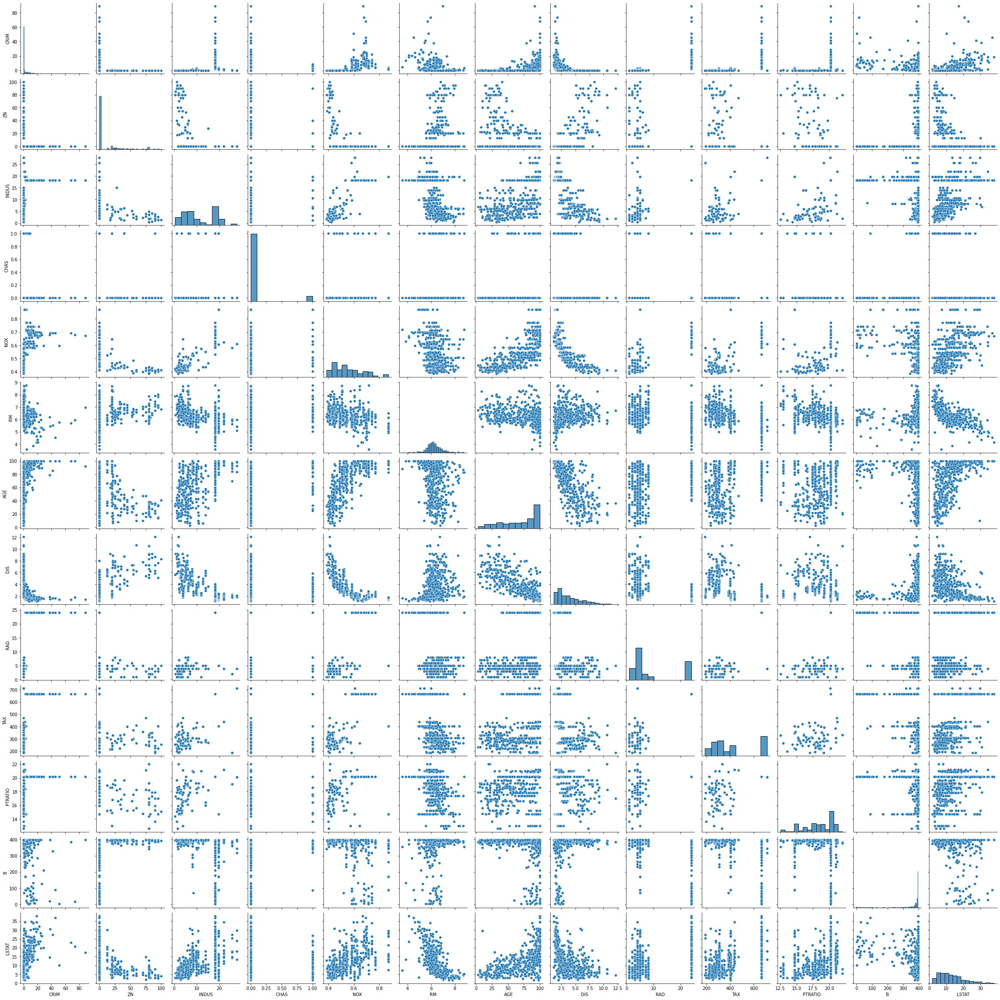

In [10]:
# Visualize data for each feature (pairplot,distplot)
sns.pairplot(X)

/home/inductiomori/.local/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

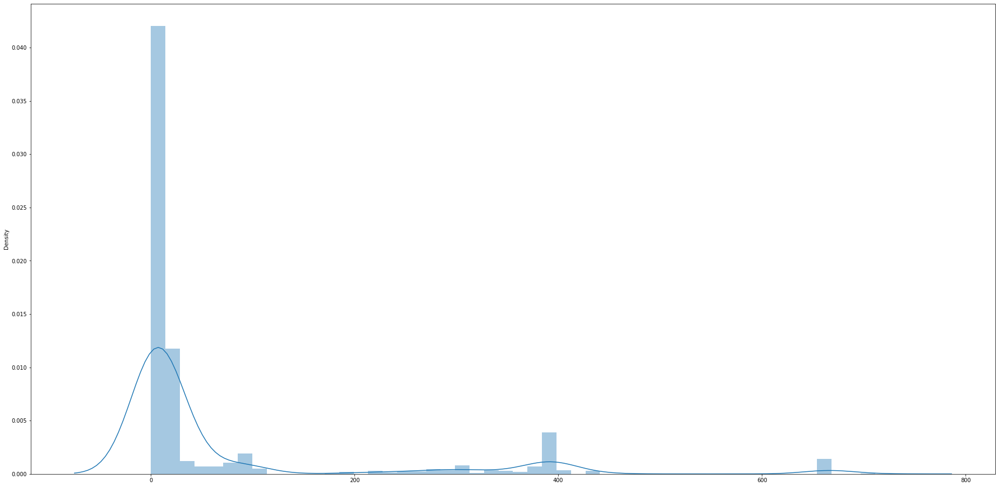

In [5]:
plt.figure(figsize=(32, 16))
sns.distplot(X)

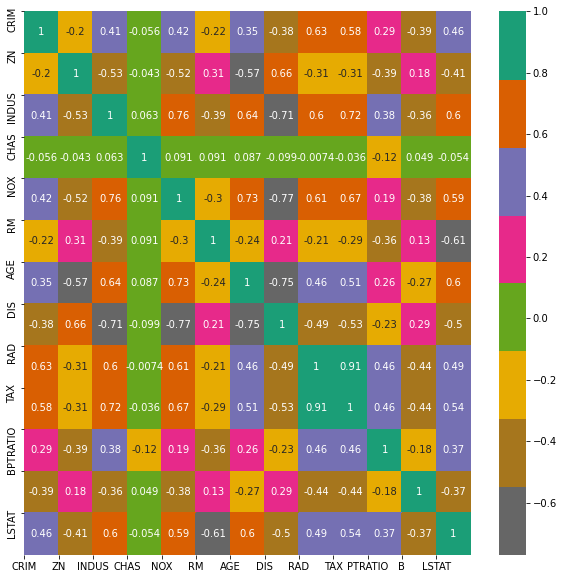

In [17]:
# Draw correlation matrix
corr = X.corr()
fig, ax = plt.subplots(figsize=(10, 10))
sns.heatmap(corr, cmap='Dark2_r', annot=True)
plt.xticks(range(len(corr.columns)), corr.columns)
plt.yticks(range(len(corr.columns)), corr.columns)
plt.show()

In [5]:
(X.corr(method='pearson') > 0.9).sum()

CRIM       1
ZN         1
INDUS      1
CHAS       1
NOX        1
RM         1
AGE        1
DIS        1
RAD        2
TAX        2
PTRATIO    1
B          1
LSTAT      1
dtype: int64

In [6]:
# Drop correlated features (check correlation matrix)
# TAX & RAD have high correlation
X_N = X.drop(['RAD'], axis=1)
#X_s = preprocessing.scale(X_N)
#X_s = pd.DataFrame(X_s, columns=X_N.columns)
#y_s = preprocessing.scale(y)
#y_s = pd.DataFrame(y_s)


In [7]:
# Handle outliers (you can use IsolationForest)
from scipy import stats
z = np.abs(stats.zscore(X))
outliers_list = list(set(np.where(z > 3)[0]))
print(len(outliers_list), outliers_list, sep='\n\n')
Xs = X.drop(outliers_list,axis = 0).reset_index(drop = False)
display(Xs)

ys = y[list(Xs["index"])]
print(ys)

91

[55, 56, 57, 102, 141, 142, 152, 154, 155, 160, 162, 163, 199, 200, 201, 202, 203, 204, 208, 209, 210, 211, 212, 216, 218, 219, 220, 221, 222, 225, 234, 236, 256, 257, 262, 269, 273, 274, 276, 277, 282, 283, 284, 347, 351, 352, 353, 354, 355, 356, 357, 358, 363, 364, 365, 367, 369, 370, 372, 373, 374, 380, 398, 404, 405, 406, 410, 411, 412, 414, 415, 416, 418, 419, 423, 424, 425, 426, 427, 429, 431, 436, 437, 438, 445, 450, 454, 455, 456, 457, 466]


,index,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
410,501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67
411,502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08
412,503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64
413,504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48


[24.  21.6 34.7 33.4 36.2 28.7 22.9 27.1 16.5 18.9 15.  18.9 21.7 20.4
 18.2 19.9 23.1 17.5 20.2 18.2 13.6 19.6 15.2 14.5 15.6 13.9 16.6 14.8
 18.4 21.  12.7 14.5 13.2 13.1 13.5 18.9 20.  21.  24.7 30.8 34.9 26.6
 25.3 24.7 21.2 19.3 20.  16.6 14.4 19.4 19.7 20.5 25.  23.4 18.9 23.3
 19.6 18.7 16.  22.2 25.  33.  23.5 19.4 22.  17.4 20.9 24.2 21.7 22.8
 23.4 24.1 21.4 20.  20.8 21.2 20.3 28.  23.9 24.8 22.9 23.9 26.6 22.5
 22.2 23.6 28.7 22.6 22.  22.9 25.  20.6 28.4 21.4 38.7 43.8 33.2 27.5
 26.5 19.3 20.1 19.5 19.5 20.4 19.8 19.4 21.7 22.8 18.8 18.7 18.5 18.3
 21.2 19.2 20.4 19.3 22.  20.3 20.5 17.3 18.8 21.4 15.7 16.2 18.  14.3
 19.2 19.6 23.  18.4 15.6 18.1 17.4 17.1 13.3 17.8 14.  15.6 11.8 13.8
 15.6 14.6 17.8 15.4 21.5 19.6 19.4 13.1 41.3 24.3 23.3 50.  22.7 25.
 50.  23.8 23.8 22.3 17.4 19.1 23.1 23.6 22.6 29.4 23.2 24.6 29.9 37.2
 39.8 36.2 37.9 32.5 26.4 29.6 50.  32.  29.8 34.9 37.  30.5 36.4 31.1
 29.1 50.  33.3 30.3 34.6 22.6 24.4 22.5 28.1 23.7 25.  28.7 30.1 44.8
 37.6 3

In [8]:
Xss = Xs.drop('index', axis = 1)
print(X)

        CRIM    ZN  INDUS  CHAS    NOX     RM   AGE     DIS  RAD    TAX  \
0    0.00632  18.0   2.31   0.0  0.538  6.575  65.2  4.0900  1.0  296.0   
1    0.02731   0.0   7.07   0.0  0.469  6.421  78.9  4.9671  2.0  242.0   
2    0.02729   0.0   7.07   0.0  0.469  7.185  61.1  4.9671  2.0  242.0   
3    0.03237   0.0   2.18   0.0  0.458  6.998  45.8  6.0622  3.0  222.0   
4    0.06905   0.0   2.18   0.0  0.458  7.147  54.2  6.0622  3.0  222.0   
..       ...   ...    ...   ...    ...    ...   ...     ...  ...    ...   
501  0.06263   0.0  11.93   0.0  0.573  6.593  69.1  2.4786  1.0  273.0   
502  0.04527   0.0  11.93   0.0  0.573  6.120  76.7  2.2875  1.0  273.0   
503  0.06076   0.0  11.93   0.0  0.573  6.976  91.0  2.1675  1.0  273.0   
504  0.10959   0.0  11.93   0.0  0.573  6.794  89.3  2.3889  1.0  273.0   
505  0.04741   0.0  11.93   0.0  0.573  6.030  80.8  2.5050  1.0  273.0   

     PTRATIO       B  LSTAT  
0       15.3  396.90   4.98  
1       17.8  396.90   9.14  
2       1

In [11]:

# Normalize data
X_scaled = MinMaxScaler().fit_transform(Xss)
X_scaled

array([[0.00000000e+00, 2.25000000e-01, 6.78152493e-02, ...,
        3.13953488e-01, 1.00000000e+00, 1.07402512e-01],
       [7.32648551e-04, 0.00000000e+00, 2.42302053e-01, ...,
        6.04651163e-01, 1.00000000e+00, 2.44877726e-01],
       [7.31950458e-04, 0.00000000e+00, 2.42302053e-01, ...,
        6.04651163e-01, 9.87015473e-01, 7.60079313e-02],
       ...,
       [1.90020901e-03, 0.00000000e+00, 4.20454545e-01, ...,
        9.76744186e-01, 1.00000000e+00, 1.29213483e-01],
       [3.60460295e-03, 0.00000000e+00, 4.20454545e-01, ...,
        9.76744186e-01, 9.88993460e-01, 1.56972902e-01],
       [1.43423197e-03, 0.00000000e+00, 4.20454545e-01, ...,
        9.76744186e-01, 1.00000000e+00, 2.03238599e-01]])

In [12]:
# Split dataset into train and test set
X_train, X_test, y_train, y_test = train_test_split(X_scaled, ys, test_size = 0.30, random_state = 42)

In [14]:
model1 = LinearRegression(normalize=False)
model1.fit(X_train,y_train)
print("Score: train set: ",model1.score(X_train,y_train))
print("Score: test set: ",model1.score(X_test,y_test))

Score: train set:  0.7598701100873174
Score: test set:  0.6739782514175505


In [15]:
print(f'Regr. model coefficients: {model1.coef_}')

Regr. model coefficients: [-3.25563837e+00 -8.29392260e-01  2.88816560e-01 -6.68909372e-15
 -5.81556890e+00  2.48028155e+01 -2.83555648e+00 -8.94532193e+00
  3.59782288e+00 -5.21153158e+00 -7.70749004e+00  6.48131867e-01
 -1.02059212e+01]


In [ ]:
# Import ridge and lasso models from sklearn
# done schon on top

In [17]:
# Define 5 different alpha values for lasso and fit them. Print their R^2 sore on both
# train and test.
for alph in [0.00001,0.001,0.01,0.1,0.2]:
  print(alph, '___')
  lasso_model = Lasso(alpha=alph)
  lasso_model.fit(X_train, y_train)
  print(f'Lasso model coeff: {lasso_model.coef_}')
  print("Lasso Train: ", lasso_model.score(X_train, y_train))
  print("Lasso Test: ", lasso_model.score(X_test, y_test))

1e-05 ___
Lasso model coef: [ -3.25433698  -0.82929329   0.28768569   0.          -5.81426039
  24.8025942   -2.83535153  -8.94464085   3.59623864  -5.21024514
  -7.70696386   0.64790492 -10.20617113]
Lasso Train:  0.7598701088781534
Lasso Test:  0.6739751166536794
0.001 ___
Lasso model coef: [ -3.1221583   -0.81943898   0.17650989   0.          -5.68074016
  24.7801751   -2.81453069  -8.87513574   3.43764926  -5.08349264
  -7.65425306   0.62612673 -10.23308388]
Lasso Train:  0.7598577679427654
Lasso Test:  0.6736560528220582
0.01 ___
Lasso model coef: [ -1.87611694  -0.66211392  -0.           0.          -4.73929784
  24.65685553  -2.62917262  -8.10519924   2.19415044  -4.34849641
  -7.25110036   0.45737493 -10.56394007]
Lasso Train:  0.7589623928392681
Lasso Test:  0.6703327472317886
0.1 ___
Lasso model coef: [-0.00000000e+00 -0.00000000e+00 -0.00000000e+00  0.00000000e+00
 -0.00000000e+00  2.16168983e+01 -2.09438626e-02 -1.45890231e+00
 -0.00000000e+00 -2.92949629e+00 -5.53548273e+0

In [21]:
# Define 5 different alpha values for Ridg and fit them. Print their R^2 score on both
# train and test.
for alph in [0.00001,0.001,0.01,0.1,0.2]:
  print(alph)
  ridge_model = Ridge(alpha=alph)
  ridge_model.fit(X_train, y_train)
  print(f'Ridge model coeff: {ridge_model.coef_}')
  print("Ridge Train: ", ridge_model.score(X_train, y_train))
  print("Ridge Test: ", ridge_model.score(X_test, y_test))

1e-05
Ridge model coeff: [ -3.25562471  -0.82939033   0.2888013    0.          -5.81554667
  24.80276404  -2.83554881  -8.94530597   3.5978093   -5.21151866
  -7.70748712   0.64813433 -10.20594224]
Ridge Train:  0.7598701100865395
Ridge Test:  0.6739785350910564
0.001
Ridge model coeff: [ -3.25427328  -0.82919893   0.28729156   0.          -5.81334702
  24.79766909  -2.83478988  -8.94372586   3.59646617  -5.21023981
  -7.70719903   0.64837839 -10.20802136]
Ridge Train:  0.759870102312959
Ridge Test:  0.6740065984766289
0.01
Ridge model coeff: [ -3.24206449  -0.82745869   0.27361951   0.          -5.79342789
  24.75150688  -2.82792531  -8.92940044   3.584312    -5.1986672
  -7.70458419   0.65059239 -10.22679153]
Ridge Train:  0.759869336876535
Ridge Test:  0.6742598865551417
0.1
Ridge model coeff: [ -3.12718155  -0.81004351   0.1419533    0.          -5.60164297
  24.30470639  -2.76257496  -8.78988035   3.46805377  -5.08797736
  -7.67883348   0.67227128 -10.40211813]
Ridge Train:  0.759

In [20]:
# r^2 = Regression error/TSS 


# Simple Lin. Model
print("Simple Train: ", model1.score(X_train, y_train))
print("Simple Test: ", model1.score(X_test, y_test))

#Lasso
print("Lasso Train: ", lasso_model.score(X_train, y_train))
print("Lasso Test: ", lasso_model.score(X_test, y_test))

#Ridge
print("Ridge Train: ", ridge_model.score(X_train, y_train))
print("Ridge Test: ", ridge_model.score(X_test, y_test))

Simple Train:  0.7598701100873174
Simple Test:  0.6739782514175505
Lasso Train:  0.7014065703841068
Lasso Test:  0.6486697930206116
Ridge Train:  0.7595927028249294
Ridge Test:  0.678906462195819


In [23]:
# Make comment about results. Print best models coefficient.
# best test
print(ridge_model.coef_)
 

[-3.01327579e+00 -7.90719992e-01  5.67957547e-03  0.00000000e+00
 -5.40320908e+00  2.38375534e+01 -2.69639199e+00 -8.64223905e+00
  3.34905864e+00 -4.97478506e+00 -7.65099590e+00  6.95410803e-01
 -1.05728599e+01]


ridge -> positive correlation between alpha and better test scores
lasso -> negative correlation between alpha and better test scores

(above two are, for my case. valid)
best test score was found with ridge, where alpha=0.2 (prob. some higher alpha values could've been even better)
